# Employee Attrition: Exploratory Data Analysis (EDA)

### 1. Import Relevant Libraries/Packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import os
%matplotlib inline

### 2. Load Dataset and Explore Dataset

In [2]:
df = pd.read_csv('Employee-Attrition.csv')
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [3]:
# dataset information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [4]:
# statistical summary
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.00,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.00,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.00,7.0,14.00,29.0
Education,1470.0,2.912925,1.024165,1.0,2.00,3.0,4.00,5.0
EmployeeCount,1470.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
EmployeeNumber,1470.0,1024.865306,602.024335,1.0,491.25,1020.5,1555.75,2068.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.00,3.0,4.00,4.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.00,66.0,83.75,100.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.00,3.0,3.00,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.00,2.0,3.00,5.0


In [5]:
# statistical summary of categorical columns
df.describe(include=['object']).transpose()

,count,unique,top,freq
Attrition,1470,2,No,1233
BusinessTravel,1470,3,Travel_Rarely,1043
Department,1470,3,Research & Development,961
EducationField,1470,6,Life Sciences,606
Gender,1470,2,Male,882
JobRole,1470,9,Sales Executive,326
MaritalStatus,1470,3,Married,673
Over18,1470,1,Y,1470
OverTime,1470,2,No,1054


In [6]:
# check for missing values
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [7]:
# shape of the dataset
df.shape

(1470, 35)

In [10]:
# check for duplicate rows
df.duplicated().sum()

np.int64(0)

In [11]:
# columns in the dataset
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [17]:
# top 5 records who have higtest monthly income
df.nlargest(5, 'MonthlyIncome')

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
190,52,No,Travel_Rarely,699,Research & Development,1,4,Life Sciences,1,259,...,1,80,1,34,5,3,33,18,11,9
746,41,No,Non-Travel,247,Research & Development,7,1,Life Sciences,1,1035,...,2,80,2,21,3,3,21,16,5,10
851,56,No,Travel_Rarely,718,Research & Development,4,4,Technical Degree,1,1191,...,4,80,1,28,2,3,5,2,4,2
165,50,No,Travel_Rarely,1452,Research & Development,11,3,Life Sciences,1,226,...,2,80,0,21,5,3,5,4,4,4
568,55,Yes,Travel_Rarely,725,Research & Development,2,3,Medical,1,787,...,4,80,1,24,2,3,5,2,1,4


In [18]:
# top 5 records who have lowest monthly income
df.nsmallest(5, 'MonthlyIncome')

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
513,20,Yes,Travel_Rarely,1362,Research & Development,10,1,Medical,1,701,...,4,80,0,1,5,3,1,0,1,1
727,18,No,Non-Travel,287,Research & Development,5,2,Life Sciences,1,1012,...,4,80,0,0,2,3,0,0,0,0
764,28,No,Travel_Rarely,1144,Sales,10,1,Medical,1,1056,...,2,80,0,1,5,3,1,0,0,0
1338,30,Yes,Travel_Rarely,945,Sales,9,3,Medical,1,1876,...,3,80,0,1,3,2,1,0,0,0
1365,29,Yes,Travel_Frequently,746,Sales,24,3,Technical Degree,1,1928,...,4,80,0,1,3,3,1,0,0,0


In [19]:
# top 5 records who get the highest salary hike
df.nlargest(5, 'PercentSalaryHike')

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
120,30,No,Travel_Frequently,1312,Research & Development,23,3,Life Sciences,1,159,...,3,80,3,10,2,2,10,7,0,9
178,46,No,Travel_Rarely,526,Sales,1,2,Marketing,1,244,...,3,80,3,24,2,3,24,13,15,7
251,39,No,Travel_Frequently,505,Research & Development,2,4,Technical Degree,1,343,...,4,80,0,20,1,3,19,6,11,8
281,42,No,Travel_Rarely,635,Sales,1,1,Life Sciences,1,387,...,3,80,0,20,3,3,20,16,11,6
434,31,No,Travel_Rarely,1274,Research & Development,9,1,Life Sciences,1,581,...,4,80,1,13,6,4,13,8,0,8


In [20]:
# top 5 records who get the lowest salary hike
df.nsmallest(5, 'PercentSalaryHike')

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
13,34,No,Travel_Rarely,1346,Research & Development,19,2,Medical,1,18,...,3,80,1,3,2,3,2,2,1,2
15,29,No,Travel_Rarely,1389,Research & Development,21,4,Life Sciences,1,20,...,3,80,1,10,1,3,10,9,8,8
19,38,No,Travel_Rarely,371,Research & Development,2,3,Life Sciences,1,24,...,3,80,0,6,3,3,3,2,1,2


##### Conclusion: Data Exploration
1. There are no missing values in the dataset.
2. There are no duplicate rows in the dataset.
3. There are 1470 rows and 35 columns in the dataset.
4. The dataset contains both numerical and categorical columns.
5. People who have the highest monthly income are not leaving the company.
6. People who have the lowest monthly income are likely to leave the company.
7. People who get the highest salary hike are not leaving the company.
8. People who get the lowest salary hike are likely to leave the company.

### 3. Exploratory Data Analysis (EDA) or Data Visualization

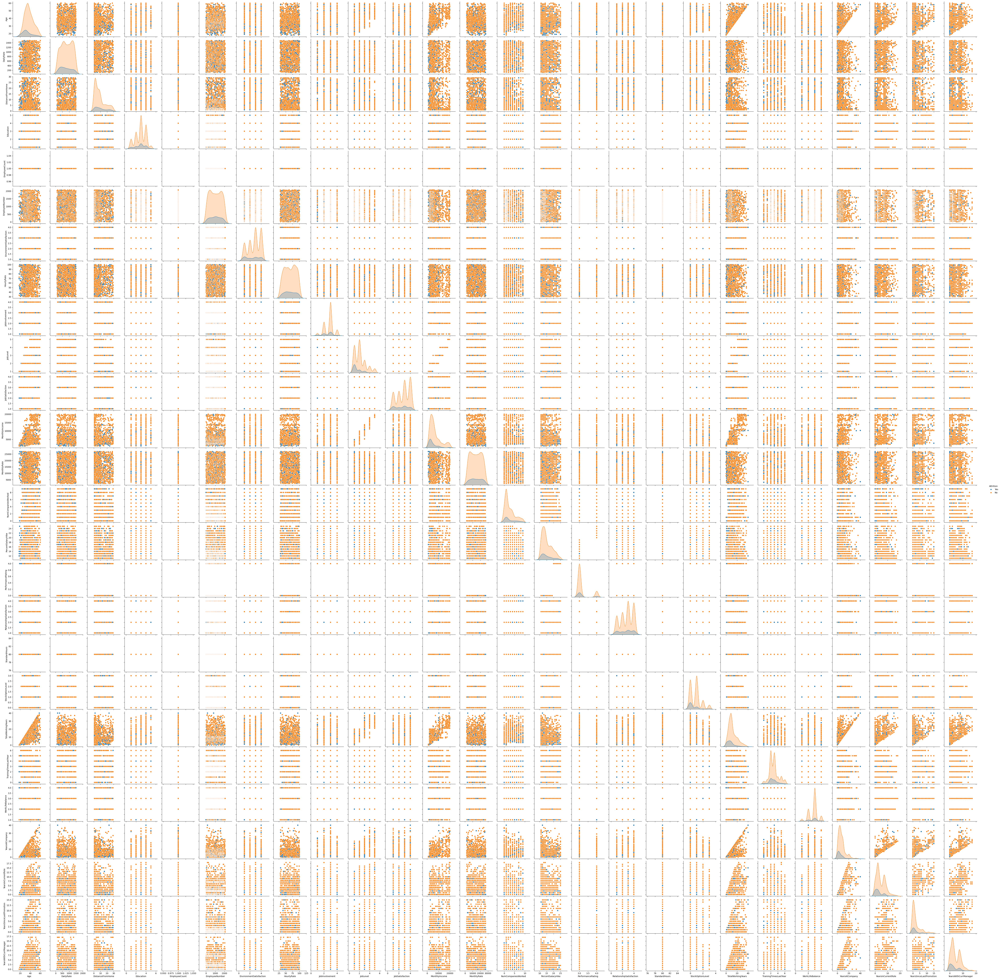

In [21]:
sns.pairplot(df, hue='Attrition')
plt.show()

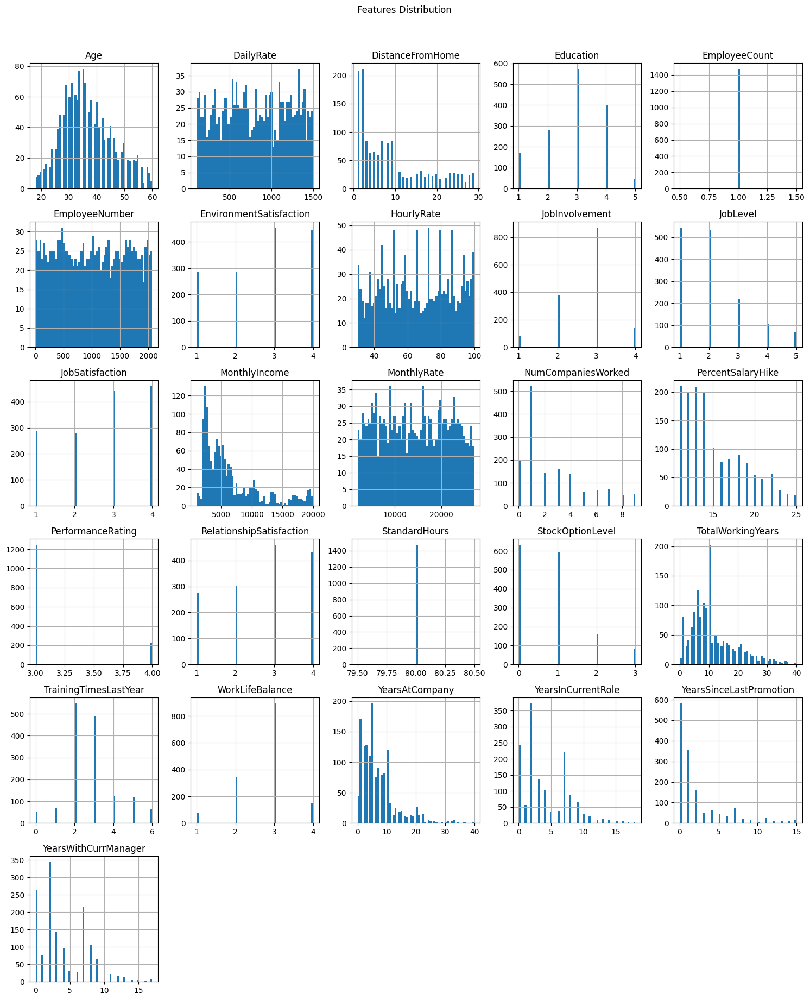

In [22]:
df.hist(figsize=(15,18),bins=60)
plt.suptitle('Features Distribution',x=0.5,y=1.02,ha='center',fontsize='large')
plt.tight_layout()
plt.show()

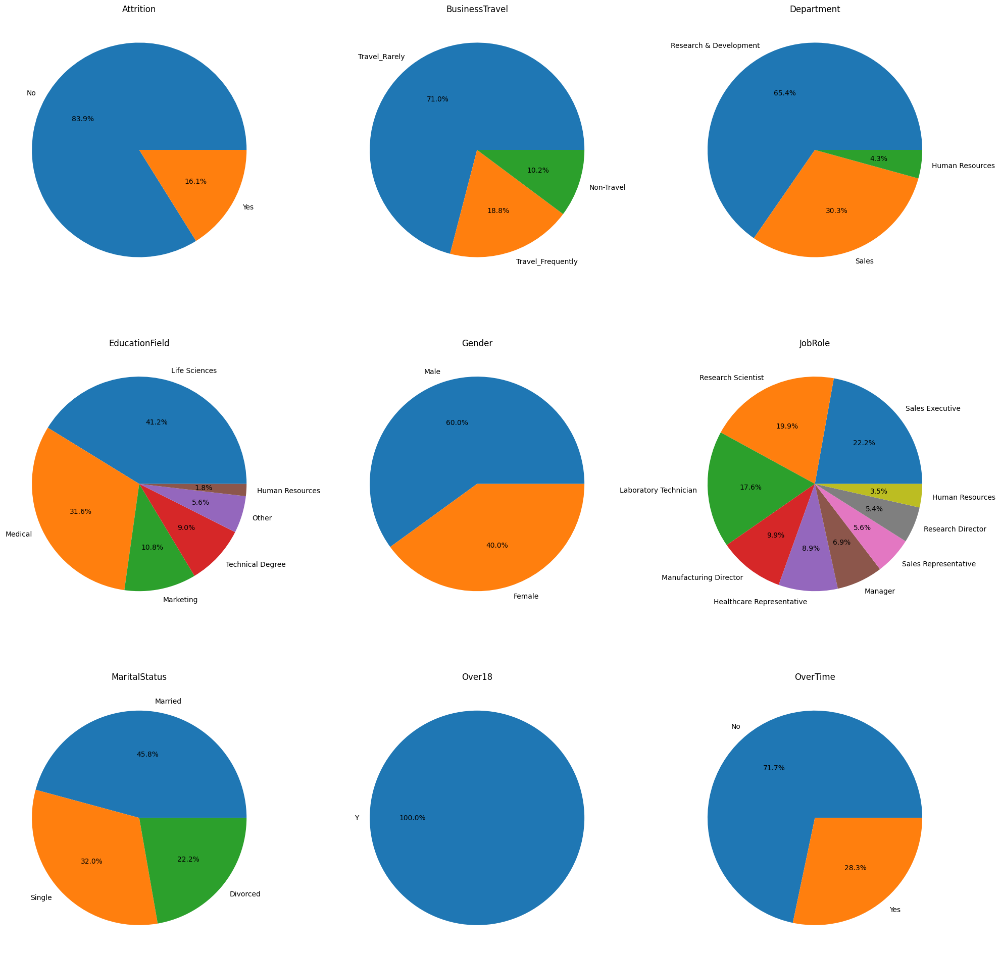

In [27]:
# Pie chart for feaatures that have object datatype using subplot
object_columns = df.select_dtypes(include=['object']).columns
fig, axes = plt.subplots(3, 3, figsize=(20, 20))
axes = axes.flatten()
for i, j in zip(object_columns, axes):
    df[i].value_counts().plot.pie(autopct='%1.1f%%', ax=j)
    j.set_title(i)
    j.set_ylabel('')
plt.tight_layout()
plt.show()

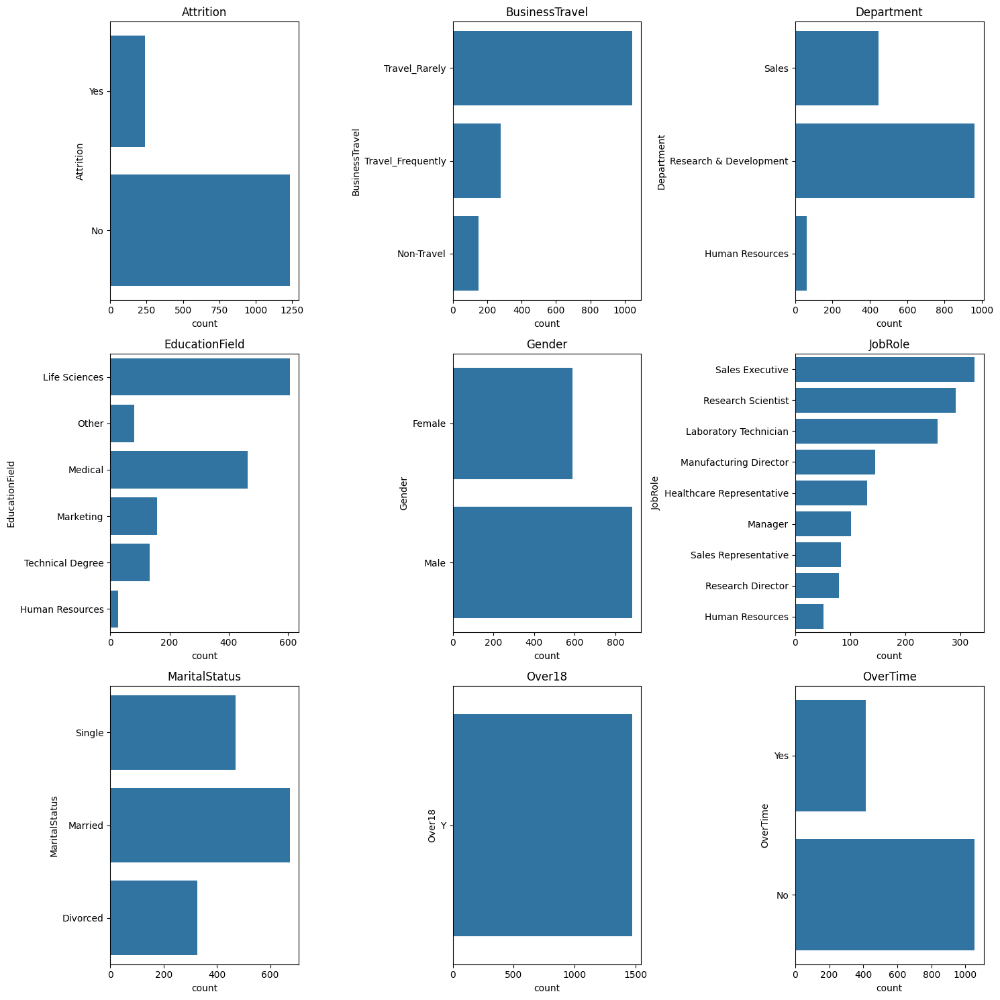

In [26]:
# Countplot for features that have object datatype using subplot
object_columns = df.select_dtypes(include=['object']).columns
plt.figure(figsize=(15,15))
for i,col in enumerate(object_columns,1):
    plt.subplot(3,3,i)
    sns.countplot(data=df,y=col)
    plt.title(col)
plt.tight_layout()
plt.show()

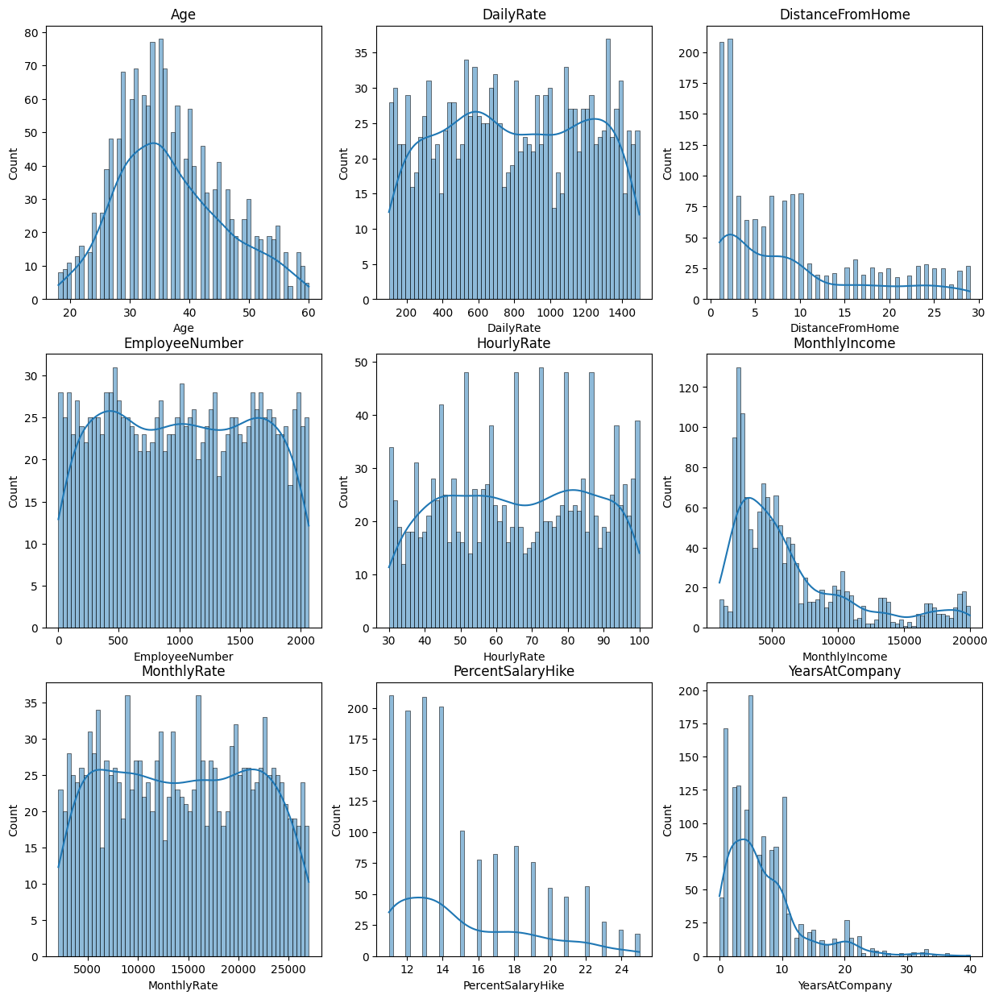

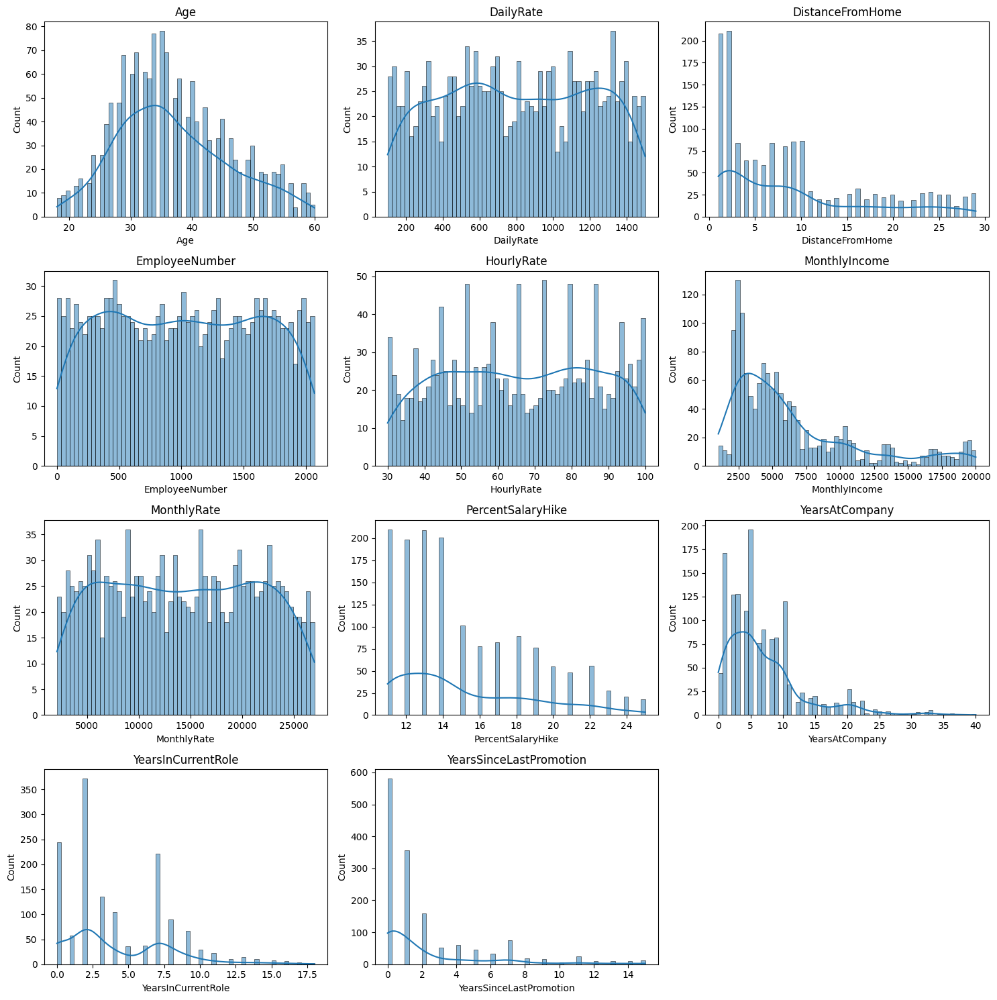

In [29]:
# histogram for features that have continuous values using subplot
continuous_columns = df[['Age','DailyRate','DistanceFromHome','EmployeeNumber','HourlyRate','MonthlyIncome','MonthlyRate','PercentSalaryHike','YearsAtCompany',
                         'YearsInCurrentRole','YearsSinceLastPromotion']]
plt.figure(figsize=(15,15))
for i,col in enumerate(continuous_columns,1):
    plt.subplot(4,3,i)
    sns.histplot(df[col],kde=True,bins=60)
    plt.title(col)
plt.tight_layout()
plt.show()